   ###                 In this project we will show how temperature change has been occured globally

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.express as px
import plotly.graph_objs as go
import seaborn as sns
import time
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
global_temp_country = pd.read_csv("E:\Project\GlobalLandTemperaturesByCity.csv")

In [3]:
global_temp_country.head()

,dt,AverageTemperature,AverageTemperatureUncertainty,City,Country,Latitude,Longitude
0,1743-11-01,6.068,1.737,Århus,Denmark,57.05N,10.33E
1,1743-12-01,NaN,NaN,Århus,Denmark,57.05N,10.33E
2,1744-01-01,NaN,NaN,Århus,Denmark,57.05N,10.33E
3,1744-02-01,NaN,NaN,Århus,Denmark,57.05N,10.33E
4,1744-03-01,NaN,NaN,Århus,Denmark,57.05N,10.33E


In [4]:
global_temp=pd.read_csv("E:\Project\GlobalTemperatures.csv")

In [5]:
global_temp.head()

,dt,LandAverageTemperature,LandAverageTemperatureUncertainty,LandMaxTemperature,LandMaxTemperatureUncertainty,LandMinTemperature,LandMinTemperatureUncertainty,LandAndOceanAverageTemperature,LandAndOceanAverageTemperatureUncertainty
0,1750-01-01,3.034,3.574,NaN,NaN,NaN,NaN,NaN,NaN
1,1750-02-01,3.083,3.702,NaN,NaN,NaN,NaN,NaN,NaN
2,1750-03-01,5.626,3.076,NaN,NaN,NaN,NaN,NaN,NaN
3,1750-04-01,8.490,2.451,NaN,NaN,NaN,NaN,NaN,NaN
4,1750-05-01,11.573,2.072,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
GlobalTempState = pd.read_csv("E:\Project\GlobalLandTemperaturesByState.csv") 

In [7]:
GlobalTempState.head()

,dt,AverageTemperature,AverageTemperatureUncertainty,State,Country
0,1855-05-01,25.544,1.171,Acre,Brazil
1,1855-06-01,24.228,1.103,Acre,Brazil
2,1855-07-01,24.371,1.044,Acre,Brazil
3,1855-08-01,25.427,1.073,Acre,Brazil
4,1855-09-01,25.675,1.014,Acre,Brazil


In [8]:
global_temp_country.isna().sum()

dt                                    0
AverageTemperature               364130
AverageTemperatureUncertainty    364130
City                                  0
Country                               0
Latitude                              0
Longitude                             0
dtype: int64

In [9]:
global_temp_country.dropna(axis='index',how='any',subset=['AverageTemperature'],inplace=True)

In [10]:
def fetch_year(date):
    return date.split('-')[0]
global_temp['years']=global_temp['dt'].apply(fetch_year)
global_temp.head()

,dt,LandAverageTemperature,LandAverageTemperatureUncertainty,LandMaxTemperature,LandMaxTemperatureUncertainty,LandMinTemperature,LandMinTemperatureUncertainty,LandAndOceanAverageTemperature,LandAndOceanAverageTemperatureUncertainty,years
0,1750-01-01,3.034,3.574,NaN,NaN,NaN,NaN,NaN,NaN,1750
1,1750-02-01,3.083,3.702,NaN,NaN,NaN,NaN,NaN,NaN,1750
2,1750-03-01,5.626,3.076,NaN,NaN,NaN,NaN,NaN,NaN,1750
3,1750-04-01,8.490,2.451,NaN,NaN,NaN,NaN,NaN,NaN,1750
4,1750-05-01,11.573,2.072,NaN,NaN,NaN,NaN,NaN,NaN,1750


In [11]:
avg_temp=global_temp_country.groupby(['Country'])['AverageTemperature'].mean().to_frame().reset_index()
avg_temp

,Country,AverageTemperature
0,Afghanistan,13.816497
1,Albania,15.525828
2,Algeria,17.763206
3,Angola,21.759716
4,Argentina,16.999216
...,...,...
154,Venezuela,25.482422
155,Vietnam,24.846825
156,Yemen,25.768408
157,Zambia,20.937623


In [12]:
fig=px.choropleth(avg_temp,locations='Country',locationmode='country names',color='AverageTemperature')
fig.update_layout(title='Choropleth map of average temperature')
fig.show()

<AxesSubplot:xlabel='AverageTemperature', ylabel='Country'>

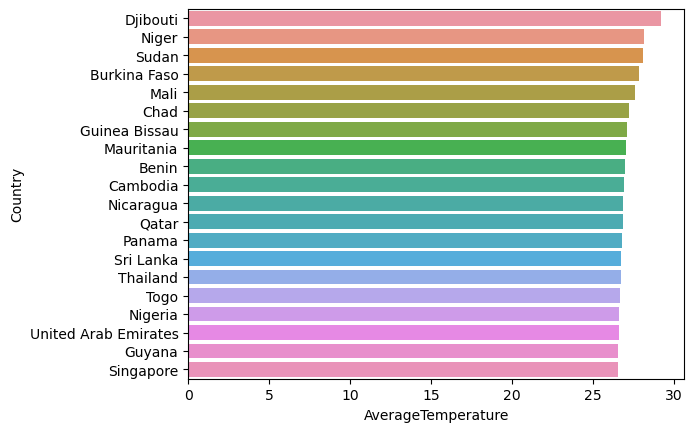

In [13]:
# The average temperature and Horizontal Bar sort by countries

sns.barplot(x=avg_temp.sort_values(by='AverageTemperature',ascending=False)['AverageTemperature'][0:20],y=avg_temp.sort_values(by='AverageTemperature',ascending=False)['Country'][0:20])

In [14]:
data=global_temp.groupby('years').agg({'LandAverageTemperature':'mean','LandAverageTemperatureUncertainty':'mean'}).reset_index()
data.head()

,years,LandAverageTemperature,LandAverageTemperatureUncertainty
0,1750,8.719364,2.637818
1,1751,7.976143,2.781143
2,1752,5.779833,2.977000
3,1753,8.388083,3.176000
4,1754,8.469333,3.494250


In [15]:
data['Uncertainty top']=data['LandAverageTemperature']+data['LandAverageTemperatureUncertainty']
data['Uncertainty bottom']=data['LandAverageTemperature']-data['LandAverageTemperatureUncertainty']

In [16]:
fig=px.line(data,x='years',y=['LandAverageTemperature',
       'Uncertainty top', 'Uncertainty bottom'],title='Average Land Tmeperature in World')
fig.show()

In [17]:
global_temp = global_temp[['dt', 'LandAverageTemperature']]

global_temp['dt'] = pd.to_datetime(global_temp['dt'])
global_temp['year'] = global_temp['dt'].map(lambda x: x.year)
global_temp['month'] = global_temp['dt'].map(lambda x: x.month)

def get_season(month):
    if month >= 3 and month <= 5:
        return 'spring'
    elif month >= 6 and month <= 8:
        return 'summer'
    elif month >= 9 and month <= 11:
        return 'autumn'
    else:
        return 'winter'
    
min_year = global_temp['year'].min()
max_year = global_temp['year'].max()
years = range(min_year, max_year + 1)

global_temp['season'] = global_temp['month'].apply(get_season)

spring_temps = []
summer_temps = []
autumn_temps = []
winter_temps = []

for year in years:
    curr_years_data = global_temp[global_temp['year'] == year]
    spring_temps.append(curr_years_data[curr_years_data['season'] == 'spring']['LandAverageTemperature'].mean())
    summer_temps.append(curr_years_data[curr_years_data['season'] == 'summer']['LandAverageTemperature'].mean())
    autumn_temps.append(curr_years_data[curr_years_data['season'] == 'autumn']['LandAverageTemperature'].mean())
    winter_temps.append(curr_years_data[curr_years_data['season'] == 'winter']['LandAverageTemperature'].mean())

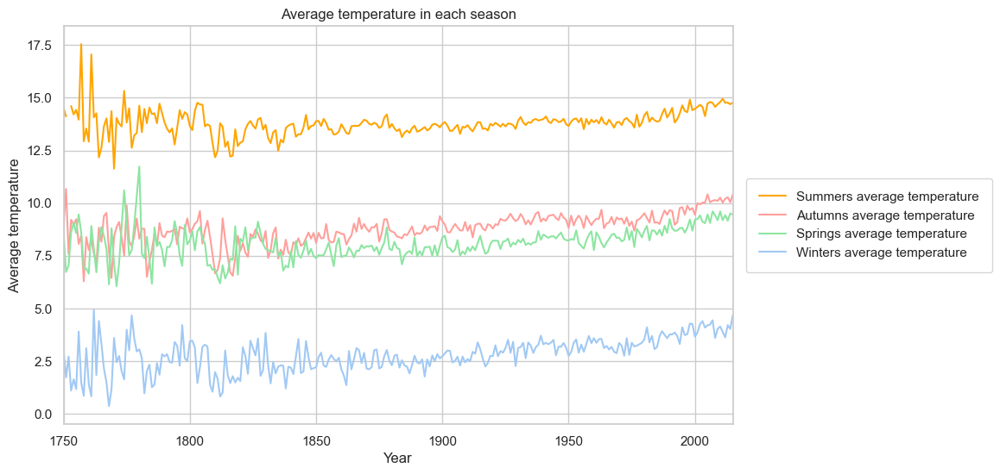

In [18]:
sns.set(style="whitegrid")
sns.set_color_codes("pastel")
f, ax = plt.subplots(figsize=(10, 6))

plt.plot(years, summer_temps, label='Summers average temperature', color='orange')
plt.plot(years, autumn_temps, label='Autumns average temperature', color='r')
plt.plot(years, spring_temps, label='Springs average temperature', color='g')
plt.plot(years, winter_temps, label='Winters average temperature', color='b')

plt.xlim(min_year, max_year)

ax.set_ylabel('Average temperature')
ax.set_xlabel('Year')
ax.set_title('Average temperature in each season')
legend = plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), frameon=True, borderpad=1, borderaxespad=1)

In [19]:
# Statewise scenario of average temperature.
country_state_temp = GlobalTempState.groupby(by = ['Country','State']).mean().reset_index().sort_values('AverageTemperature',ascending=False).reset_index()
country_state_temp
country_state_temp["world"] = "world" 
fig = px.treemap(country_state_temp.head(200), path=['world', 'Country','State'], values='AverageTemperature',
                  color='State',color_continuous_scale='RdGr')
fig.show()

In [20]:
global_temp_country_n = pd.read_csv("E:\Project\GlobalLandTemperaturesByCountry.csv")

In [21]:
global_temp_country_n.head()

,dt,AverageTemperature,AverageTemperatureUncertainty,Country
0,1743-11-01,4.384,2.294,Åland
1,1743-12-01,NaN,NaN,Åland
2,1744-01-01,NaN,NaN,Åland
3,1744-02-01,NaN,NaN,Åland
4,1744-03-01,NaN,NaN,Åland


In [22]:
global_temp_country_n.isna().sum()

dt                                   0
AverageTemperature               32651
AverageTemperatureUncertainty    31912
Country                              0
dtype: int64

In [23]:
global_temp_country_n.dropna(axis='index',how='any',subset=['AverageTemperature'],inplace=True)

In [24]:
avg_temp_c=global_temp_country_n.groupby(['Country'])['AverageTemperature'].mean().to_frame().reset_index()
avg_temp_c

,Country,AverageTemperature
0,Afghanistan,14.045007
1,Africa,24.074203
2,Albania,12.610646
3,Algeria,22.985112
4,American Samoa,26.611965
...,...,...
237,Western Sahara,22.319818
238,Yemen,26.253597
239,Zambia,21.282956
240,Zimbabwe,21.117547


In [25]:
# Statewise scenario of average temperature.
country_temp = global_temp_country_n.groupby(by = ['Country']).mean().reset_index().sort_values('AverageTemperature',ascending=False).reset_index()
country_temp
country_temp["world"] = "world" 
fig = px.treemap(country_temp.head(200), path=['world', 'Country'], values='AverageTemperature',
                  color='Country',color_continuous_scale='RdGr')
fig.show()

### In this next project we will do an analysis on CO2 emission and show correlation between CO2 emission and temperature change

In [26]:
import matplotlib as mpl
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from darts import TimeSeries
from darts.models import *
from darts.metrics import *
from darts.dataprocessing.transformers import Scaler
import logging

mpl.rcParams['figure.dpi'] = 300
logging.disable(logging.CRITICAL)

In [27]:
df = pd.read_csv("E:\Project\monthly_in_situ_co2_mlo.csv",
                  comment = '"', header = [0,1,2], na_values = '-99.99')

cols = [' '.join(col).replace(' ', '') for col in df.columns.values]
df.set_axis(cols, axis = 1, inplace = True)

# Converting Excel date format to datetime
# and setting as dataframe index
df['datetime'] = pd.to_datetime(df['DateExcel'], origin = '1899-12-30', unit = 'D')

df.set_index('datetime', inplace = True)

df = df[['CO2filled[ppm]']]
df.rename(columns = {'CO2filled[ppm]': 'CO2'}, inplace = True)
df.dropna(inplace = True)
df = df.resample('M').sum()

In [28]:
df

,CO2
datetime,
1958-03-31,315.71
1958-04-30,317.45
1958-05-31,317.51
1958-06-30,317.26
1958-07-31,315.87
...,...
2022-09-30,415.41
2022-10-31,415.31
2022-11-30,417.04


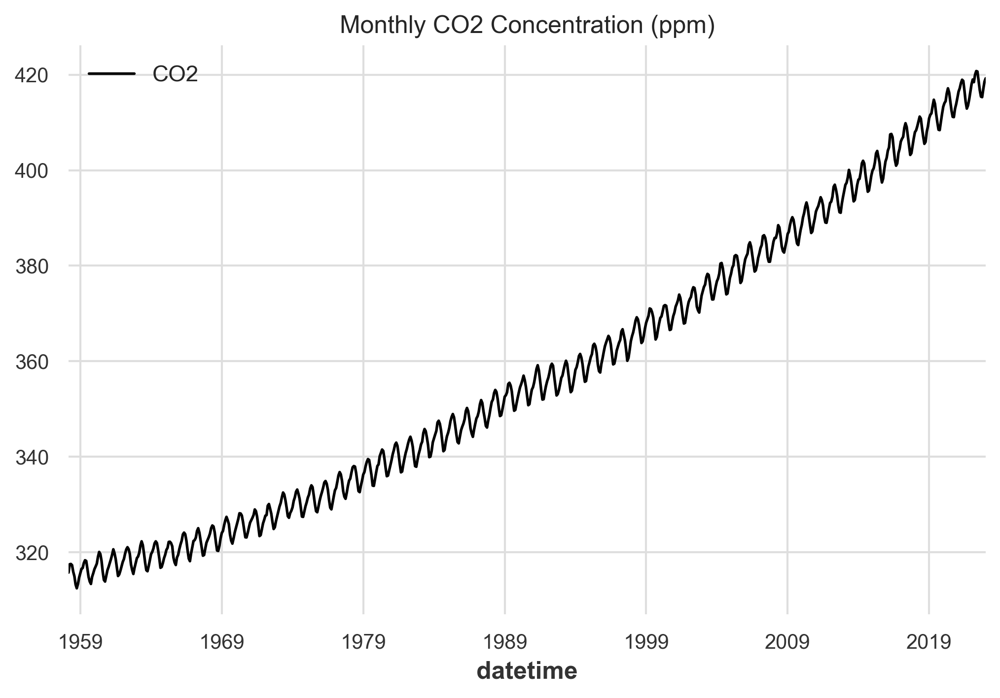

In [29]:
df.plot(figsize=(8,5))
plt.title('Monthly CO2 Concentration (ppm)')

plt.show()

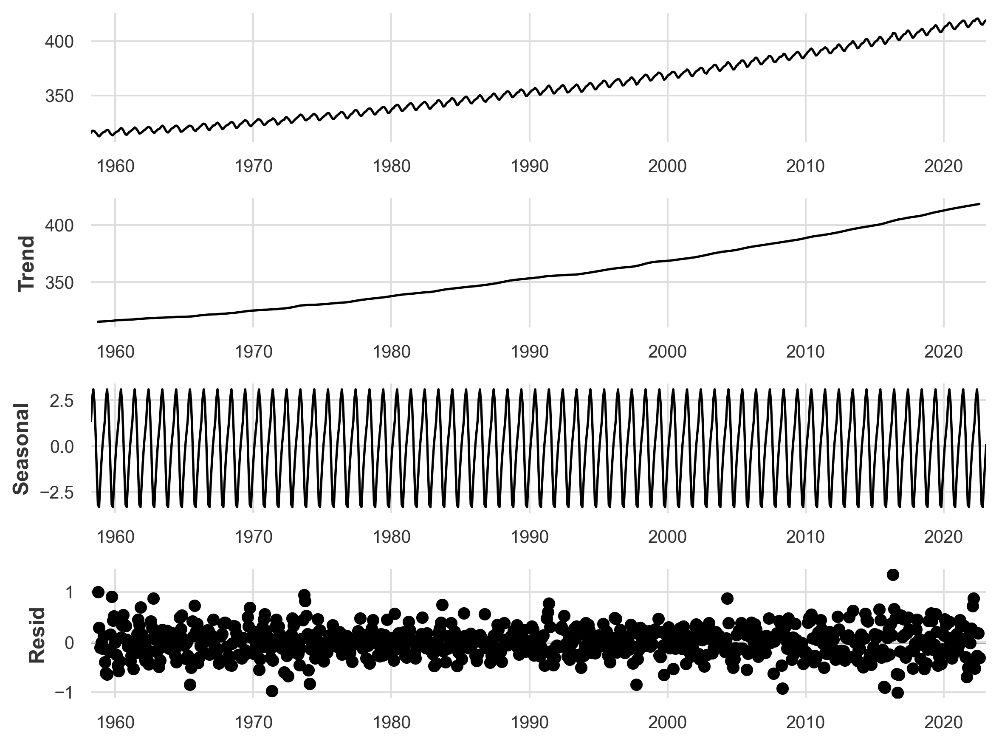

In [30]:
mpl.rcParams['figure.figsize'] = (8, 6)

result = seasonal_decompose(df)
result.plot()

plt.show()

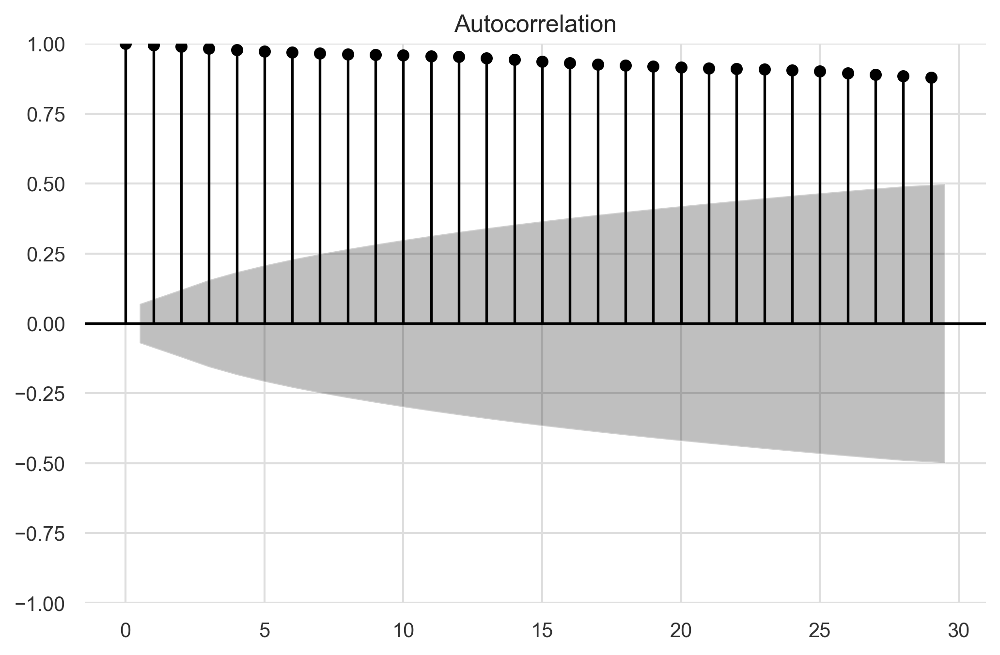

In [31]:
fig, ax = plt.subplots(figsize = (8,5))

plot_acf(df, ax = ax)

plt.show()

In [32]:
series = TimeSeries.from_dataframe(df)

start = pd.Timestamp('123115')
df_metrics = pd.DataFrame()

def plot_backtest(series, forecast, model_name):
    idx = -144
    series[idx:].plot(label='Actual Values')
    forecast[idx:].plot(label= 'Forecast')
    plt.title(model_name)
    plt.show()
    
def print_metrics(series, forecast, model_name):
    mae_ = mae(series, forecast)
    rmse_ = rmse(series, forecast)
    mape_ = mape(series, forecast)
    smape_ = smape(series, forecast)
    r2_score_ = r2_score(series, forecast)
    
    dict_ = {'MAE': mae_, 'RMSE': rmse_,
             'MAPE': mape_, 'SMAPE': smape_, 
             'R2': r2_score_}
    
    df = pd.DataFrame(dict_, index = [model_name])
    
    return(df.round(decimals = 2))

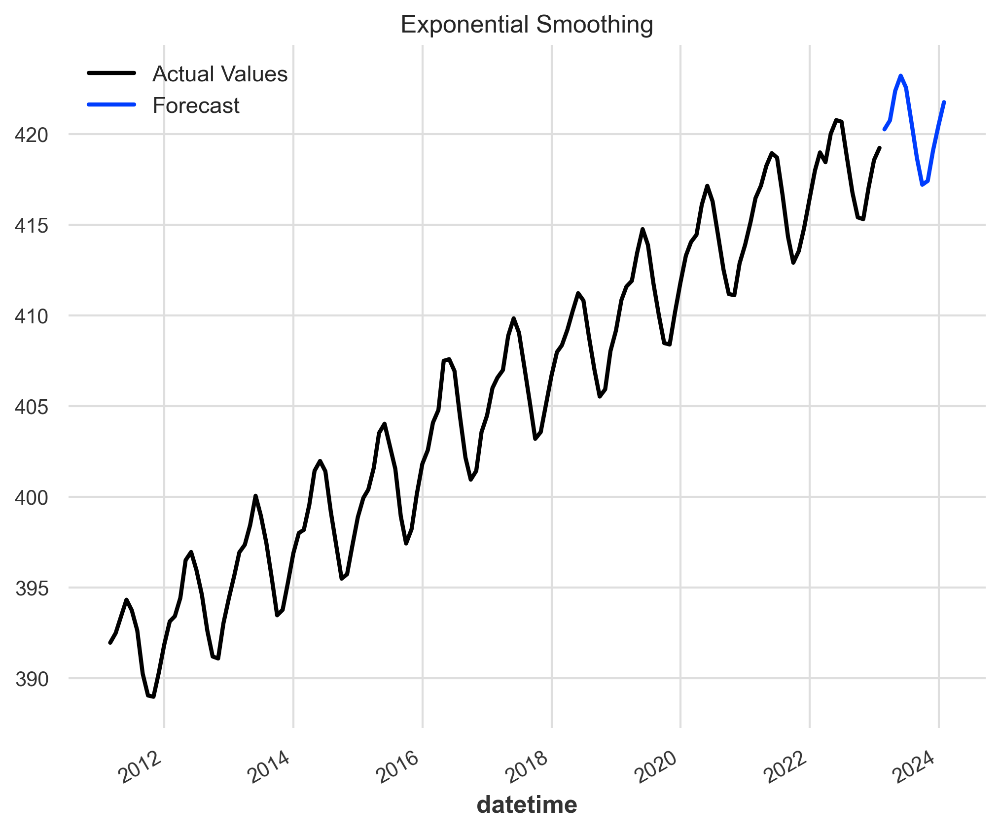

component          CO2
datetime              
2023-02-28  420.263068
2023-03-31  420.752672
2023-04-30  422.386148
2023-05-31  423.218491
2023-06-30  422.561992
2023-07-31  420.645056
2023-08-31  418.667909
2023-09-30  417.208132
2023-10-31  417.420333
2023-11-30  419.090192
2023-12-31  420.480649
2024-01-31  421.759529


In [33]:
model = ExponentialSmoothing(seasonal_periods = 12)
model_name = 'Exponential Smoothing'

model.fit(series)
forecast = model.predict(12)

plot_backtest(series, forecast, model_name)
print(forecast.pd_dataframe())

### We will visualize now world's CO2 emission

In [34]:
co2 = pd.read_csv("E:\Project\CO2_Emission.txt", delimiter=';')

print(co2)

          lat    lon    emission
0        88.1  -50.7     11.0301
1        88.1  -50.6     15.7066
2        88.1  -50.5     19.1943
3        88.1  -50.4     22.0621
4        88.1  -50.3     24.5536
...       ...    ...         ...
2191880 -77.8  166.5  11459.2000
2191881 -77.8  166.6    694.4980
2191882 -77.9  166.3   2133.1000
2191883 -77.9  166.4   1389.0000
2191884 -77.9  166.5   7887.5100

[2191885 rows x 3 columns]


In [35]:
co2 = co2.sort_values('emission', ascending=False)
print(co2[:10])

          lat    lon     emission
798909   41.0  122.5  355301000.0
1098659  31.2  121.3  330941000.0
1129717  30.1  115.0  209367000.0
1124042  30.3  114.1   82808100.0
407743   53.4   59.0   68397600.0
1282838  24.2  120.4   62984400.0
845540   39.5  116.2   57421000.0
337844   55.9   37.7   56890200.0
795787   41.1  123.4   55067700.0
1301463  23.4   86.3   50850200.0


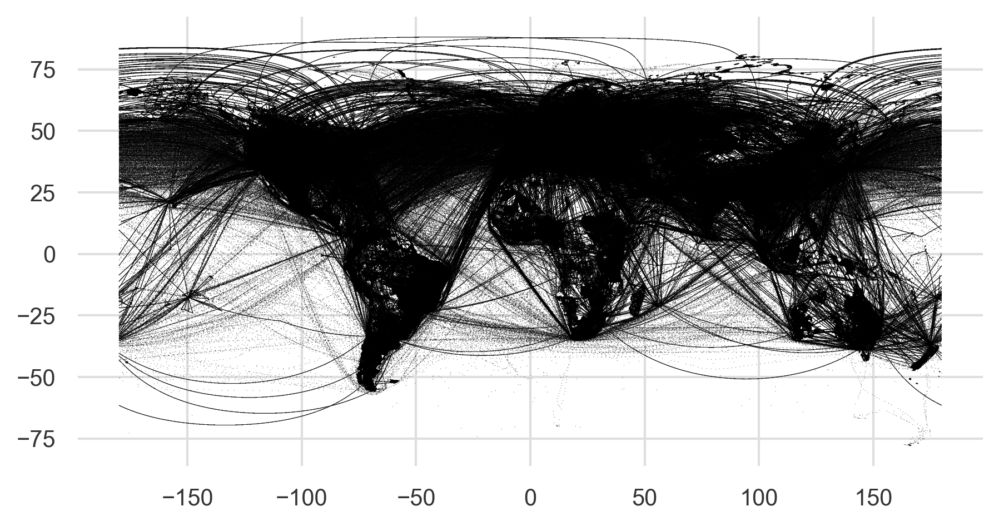

In [36]:
fig = plt.figure()
fig.set_size_inches(7, 3.5)
plt.scatter(co2['lon'], co2['lat'], s=0.05,  edgecolors='none')
plt.show()

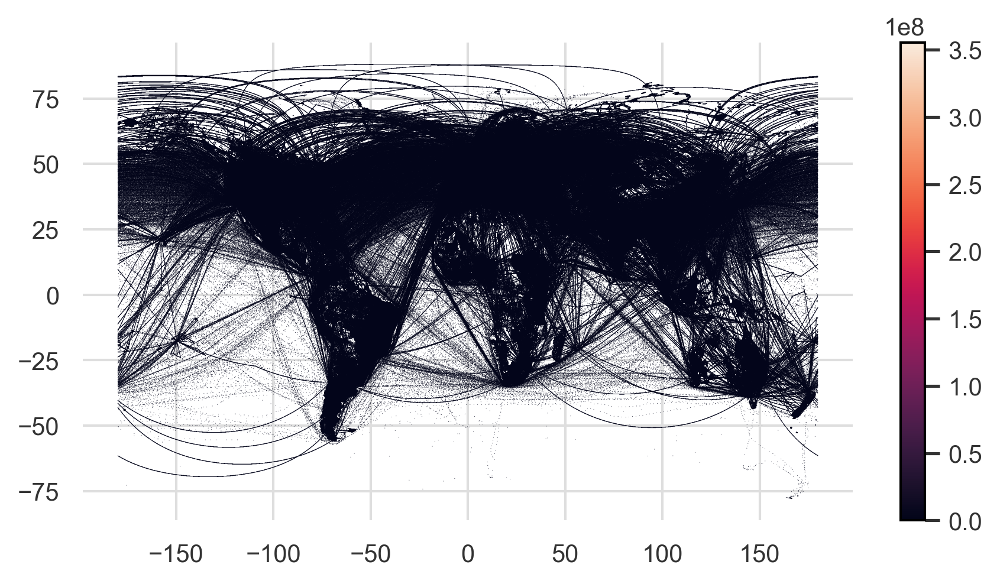

In [37]:
fig = plt.figure()
fig.set_size_inches(7, 3.5)
cols = plt.scatter(co2['lon'], co2['lat'], c=co2['emission'], s=0.05,  edgecolors='none')
plt.colorbar(cols)
plt.show()

In [38]:
print(co2.emission.value_counts())
print()
print("Min value: ", np.amin(co2.emission))
print("Max value: ", np.amax(co2.emission))

3.472490e+02    30310
2.480350e+02    27141
2.976420e+02    22373
3.968560e+02    17280
1.488210e+02    17257
                ...  
1.365400e+03        1
1.365340e+03        1
1.365330e+03        1
1.365320e+03        1
8.016030e-07        1
Name: emission, Length: 1215854, dtype: int64

Min value:  8.01603e-07
Max value:  355301000.0


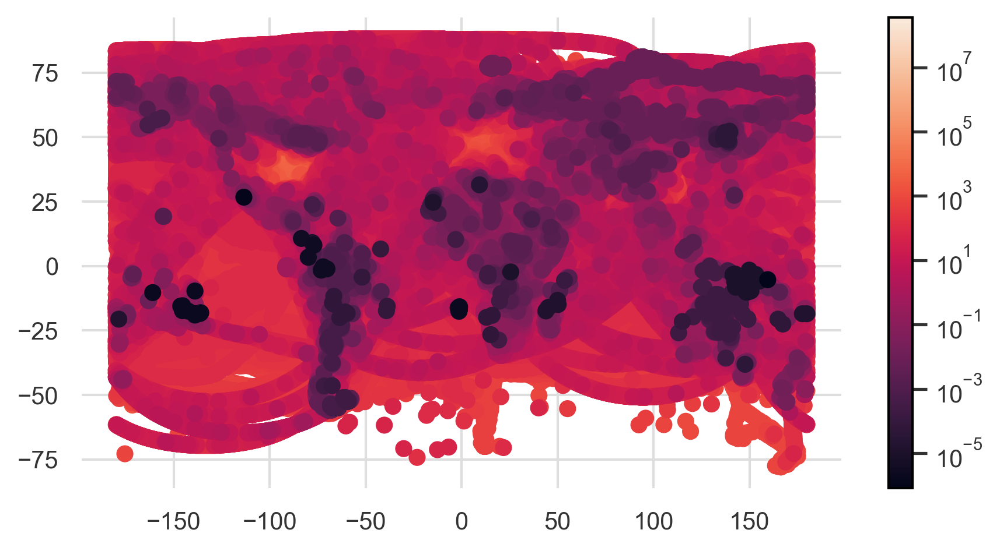

In [39]:
from matplotlib import colors

fig = plt.figure()
fig.set_size_inches(7, 3.5)
cols = plt.scatter(co2['lon'], co2['lat'], c=co2['emission'], norm=colors.LogNorm())
plt.colorbar(cols)
plt.show()

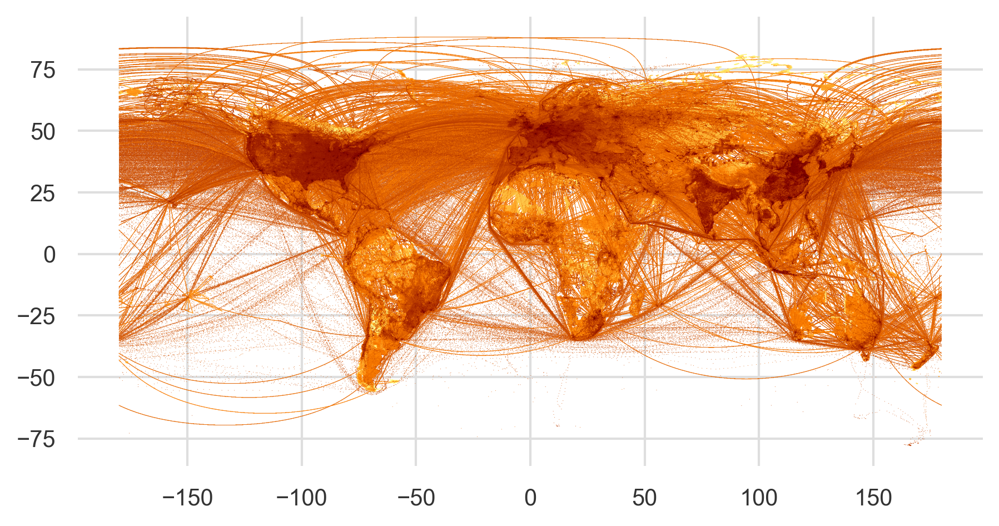

In [40]:
fig = plt.figure()
fig.set_size_inches(7, 3.5)
plt.scatter(co2['lon'], co2['lat'], s=0.05, edgecolors='none', c=co2['emission'], norm=colors.LogNorm(), cmap='afmhot_r')
plt.show()

In [41]:
import geopandas as gpd
from shapely.geometry import Point

geometry = [Point(xy) for xy in zip(co2['lon'], co2['lat'])]
geodata = gpd.GeoDataFrame(co2, crs="EPSG:4326", geometry=geometry)

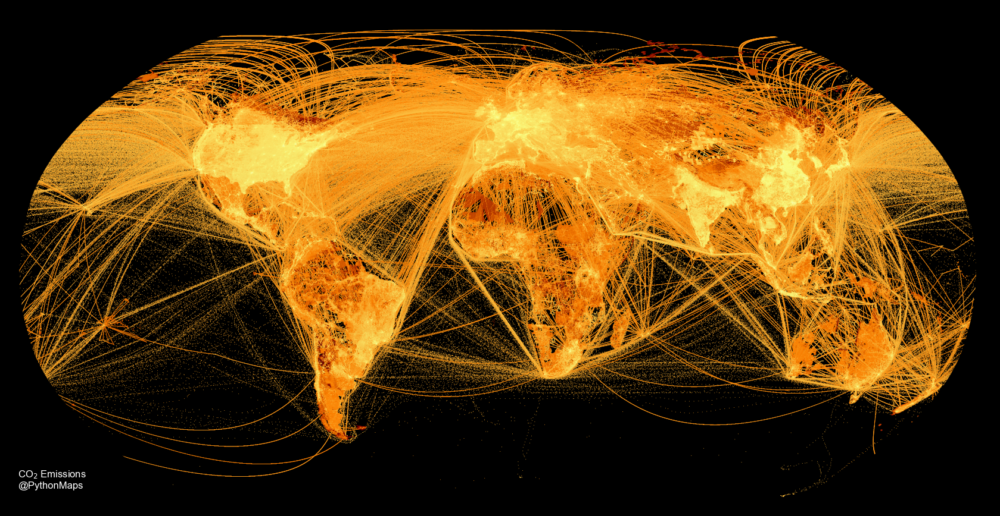

In [46]:
from cartopy import crs as ccrs

fig, ax = plt.subplots(facecolor='black', subplot_kw={'projection': ccrs.Robinson()})
ax.patch.set_facecolor('black')
fig.set_size_inches(7, 3.5)
ax = geodata.plot(ax=ax, column='emission', transform=ccrs.PlateCarree(),
                  cmap='afmhot', norm=colors.LogNorm(), s=0.05, edgecolors='none')
plt.setp(ax.spines.values(), color='black')
plt.setp([ax.get_xticklines(), ax.get_yticklines()], color='black')
ax.set_ylim(-8000000, 9000000)

newax = fig.add_axes([0.82, 0.13, 0.08, 0.08], anchor='NE')
newax.axis('off')
txt = ax.text(0.0, 0.02, "CO$_2$ Emissions \n@PythonMaps",
              size=4,
              color='white',
              transform = ax.transAxes)

plt.show()

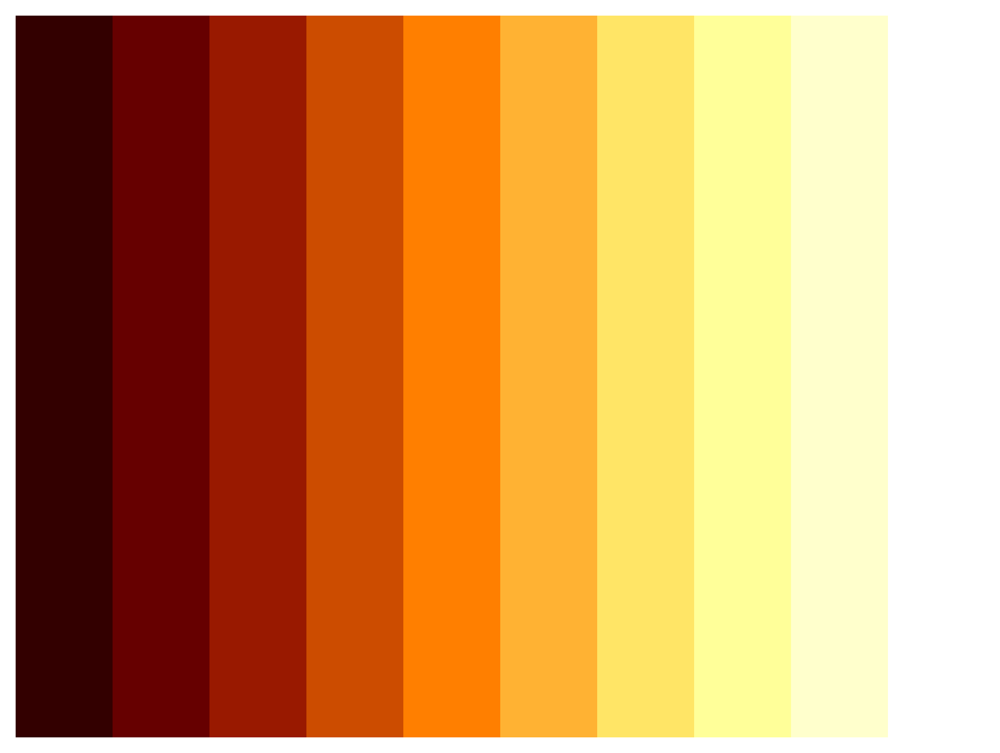

In [47]:
from matplotlib import cm
from matplotlib.colors import ListedColormap

our_cmap = cm.get_cmap('afmhot', 11)
newcolors = our_cmap(np.linspace(0, 1, 11))
newcolors = newcolors[1:]

black = np.array([0.0, 0.0, 0.0, 1.0])
#newcolors[:1, :] = black
our_cmap = ListedColormap(newcolors)
bounds = [0.0, 0.06, 6, 60, 600, 3000, 6000, 24000, 45000, 120000]
norm = colors.BoundaryNorm(bounds, our_cmap.N)

gradient = np.linspace(0, 1, 10)
gradient = np.vstack((gradient, gradient))
plt.imshow(gradient, aspect='auto', cmap=our_cmap)
plt.axis('off')
plt.show()

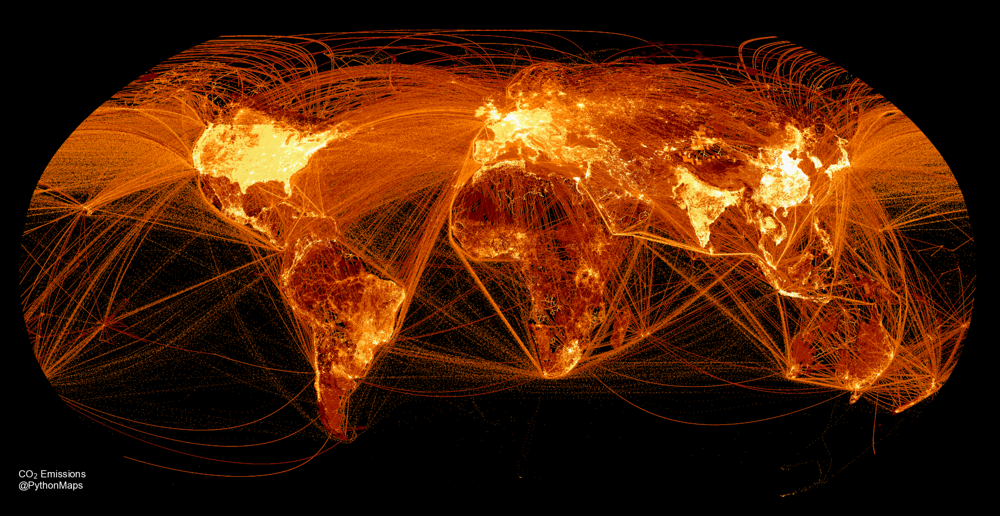

In [49]:
fig, ax = plt.subplots(facecolor='black', subplot_kw={'projection': ccrs.Robinson()})
ax.patch.set_facecolor('black')

fig.set_size_inches(7, 3.5)
ax = geodata.plot(ax=ax, column='emission', transform=ccrs.PlateCarree(),
                  cmap=our_cmap, norm=norm, s=0.05, alpha=1, edgecolors='none')

plt.setp(ax.spines.values(), color='black')
plt.setp([ax.get_xticklines(), ax.get_yticklines()], color='black')
newax = fig.add_axes([0.82, 0.13, 0.08, 0.08], anchor='NE')
newax.axis('off')
txt = ax.text(0.0, 0.02, "CO$_2$ Emissions \n@PythonMaps",
              size=4,
              color='white',
              transform = ax.transAxes)

ax.set_ylim(-8000000, 9000000)
plt.show()

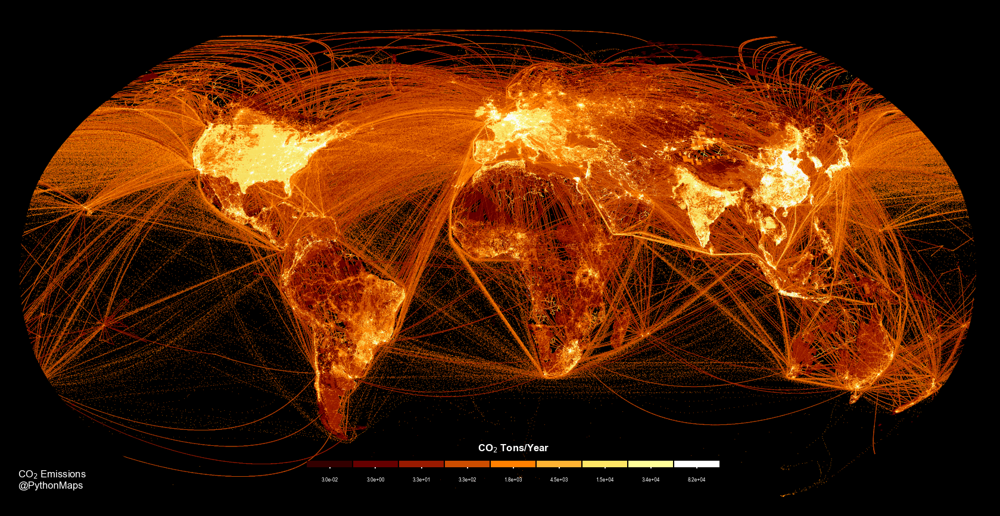

In [50]:
fig, ax = plt.subplots(facecolor='black', subplot_kw={'projection': ccrs.Robinson()})
ax.patch.set_facecolor('black')

fig.set_size_inches(7, 3.5)
ax = geodata.plot(ax=ax, column='emission', transform=ccrs.PlateCarree(),
                  cmap=our_cmap, norm=norm, s=0.05, alpha=1, edgecolors='none')

plt.setp(ax.spines.values(), color='black')
plt.setp([ax.get_xticklines(), ax.get_yticklines()], color='black')
newax = fig.add_axes([0.82, 0.13, 0.08, 0.08], anchor='NE')
newax.axis('off')
txt = ax.text(0.0, 0.02, "CO$_2$ Emissions \n@PythonMaps",
              size=4,
              color='white',
              transform = ax.transAxes)

ax.set_ylim(-8000000, 9000000)

fig = ax.get_figure()
cax = fig.add_axes([0.36, 0.16, 0.33, 0.01])
sm = plt.cm.ScalarMappable(cmap=our_cmap, norm=norm)
sm._A = []
cb = fig.colorbar(sm, cax=cax, orientation="horizontal", pad=0.2, format='%.1e',
                  ticks=[0.03, 3, 33, 330, 1800, 4500, 15000, 34500, 82500],
                  drawedges=True)
cb.outline.set_visible(False)
#cb.outline.set_linewidth(0.00001)
#cb.outline.set_color('white')
cb.ax.tick_params(labelsize=2, width=0.5, length=0.5, color='white')
cbytick_obj = plt.getp(cb.ax, 'xticklabels' ) #Set y tick label color
plt.setp(cbytick_obj, color='white')
cb.ax.set_xlabel('CO$_2$ Tons/Year', fontsize=4, color='white', labelpad=-16)
plt.show()